# Custom Object Detector using YOLOv5




# **Overview**

This notebook creates a custom object dector using YOLOv5. Where it detects 3 objects; Formula One Cars, Drivers and Steering Wheels.


The notebook is structured by the following: 


*   Part 1 - Set Up
*   Part 2 - Training
*   Part 3 - Analysing Training Performance 
*   Part 4 - Test Model
*   Part 5 - Save Best Weights
*   Part 6 - Create Video and GIF
  

# **Part 1 - Set up**

In [ ]:
# connect to google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Check if NVIDIA GPU is enabled
!nvidia-smi

Sun Jul 11 13:28:56 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8    11W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 7957, done.
remote: Counting objects: 100% (269/269), done.
remote: Compressing objects: 100% (118/118), done.
remote: Total 7957 (delta 181), reused 219 (delta 151), pack-reused 7688
Receiving objects: 100% (7957/7957), 9.41 MiB | 32.67 MiB/s, done.
Resolving deltas: 100% (5477/5477), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [ ]:
# install dependencies
!pip install -qr requirements.txt 
import torch
from IPython.display import Image, clear_output  
from utils.google_utils import gdrive_download 


print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 645kB 37.2MB/s 
Setup complete. Using torch 1.9.0+cu102 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
# Load data from Roboflow
%cd /content
!curl -L "https://app.roboflow.com/ds/1ApWz1A8YE?key=MYKEY" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1777      0 --:--:-- --:--:-- --:--:--  1774
100 5176k  100 5176k    0     0  6619k      0 --:--:-- --:--:-- --:--:-- 6619k
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/frame101_jpg.rf.8021ba06aa3f644dda8e137294aae624.jpg  
 extracting: test/images/frame107_jpg.rf.aae990606e809bef5b5fa0c86e26cc6c.jpg  
 extracting: test/images/frame110_jpg.rf.a2ef42ac54755a5a921c8d09100b94e1.jpg  
 extracting: test/images/frame124_jpg.rf.9012c0c81be81976ef911bcb5e9fca69.jpg  
 extracting: test/images/frame150_jpg.rf.fde456ab69a8b60394b415610c4bc587.jpg  
 extracting: test/images/frame157_jpg.rf.774d25cd8d93fff5ab2bd964ad5d7bc7.jpg  
 extracting: test/images/frame160_jpg.rf.dc44eba3b5

In [ ]:
# Check classes
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 3
names: ['Driver', 'F1_Car', 'Steering']

In [ ]:
#configured yolov5s
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:

# define number of classes 
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

#customize iPython writefile 
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))



In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

#Design model 
#parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Part 2 - Training

In [ ]:
# train detection model
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 3000 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

Streaming output truncated to the last 5000 lines.
                 all          35         140       0.701       0.503       0.528       0.277

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
 2002/2999     1.43G   0.02413   0.01215  0.003481   0.03975         7       416: 100% 12/12 [00:01<00:00,  7.27it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 2/2 [00:00<00:00,  9.55it/s]
                 all          35         140       0.703       0.503       0.525       0.274

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size
 2003/2999     1.43G   0.02538   0.01489  0.003379   0.04366         4       416: 100% 12/12 [00:01<00:00,  7.18it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 2/2 [00:00<00:00,  9.58it/s]
                 all          35         140       0.711       0.503       0.526       0.269

     Epoch   

# Part 3 - Analysis on Training Performance

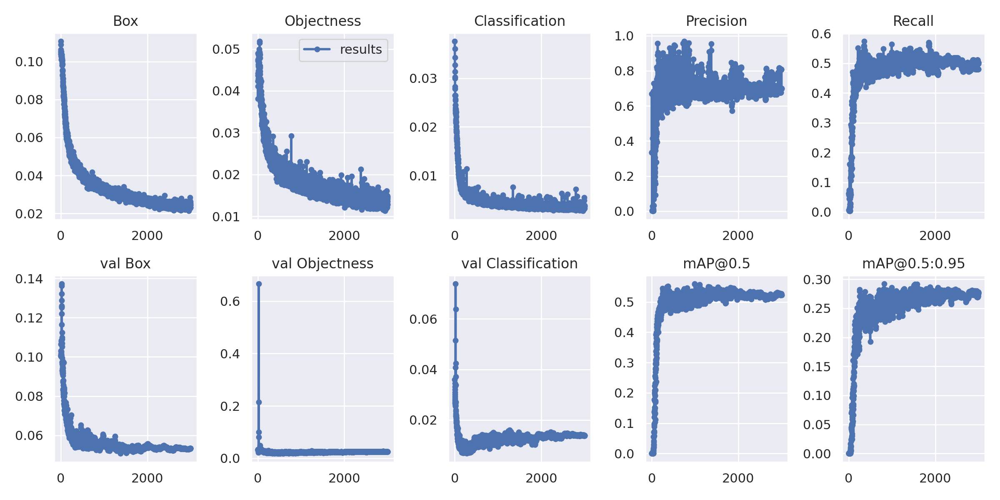

In [ ]:
#view preformence metrics

from utils.plots import plot_results  # plot results.txt as results.png
Image(filename= '/content/yolov5/runs/train/yolov5s_results2/results.png', width=1000)  # view results.png

In [ ]:
# View tensorboard metrics

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Part 4 - Test Model


In [ ]:
# check best and last weights are stored
%ls runs/
%ls runs/train/yolov5s_results2/weights

train/
best.pt  last.pt


In [ ]:
#  test the models best weights
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7251912 parameters, 0 gradients, 16.8 GFLOPS
image 1/17 /content/yolov5/../test/images/frame101_jpg.rf.8021ba06aa3f644dda8e137294aae624.jpg: 256x416 

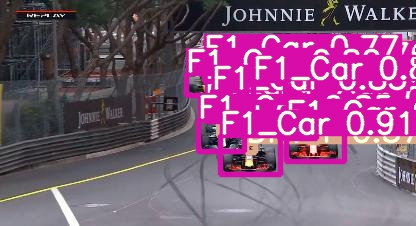

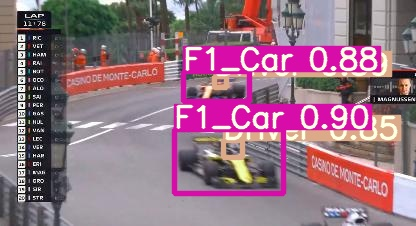

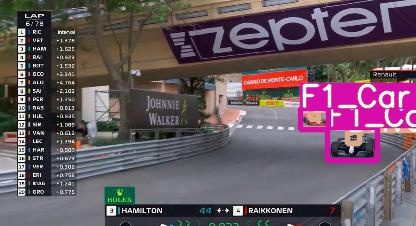

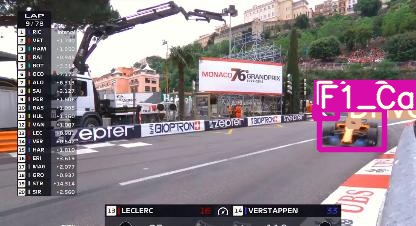

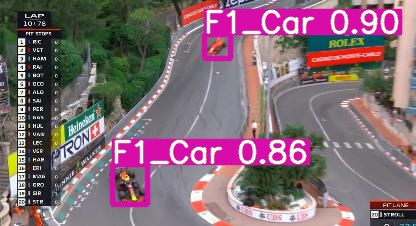

...

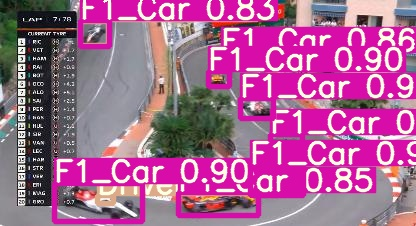

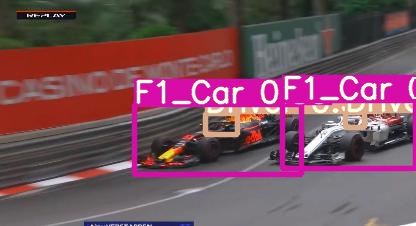

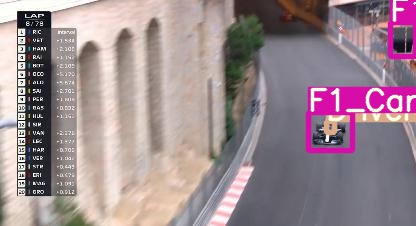

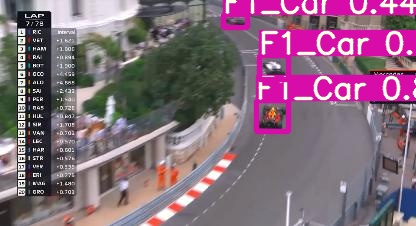

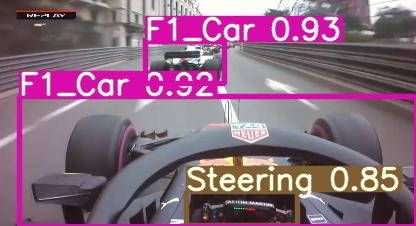

In [ ]:
#display inference on test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): 
    display(Image(filename=imageName))
    print("\n")

In [ ]:
# Zip test frames
!zip -r /content/yolov5/runs/detect/exp.zip /content/yolov5/runs/detect/exp


  adding: content/yolov5/runs/detect/exp/ (stored 0%)
  adding: content/yolov5/runs/detect/exp/frame37_jpg.rf.829afb184f859055fdd11fffc71cea19.jpg (deflated 2%)
  adding: content/yolov5/runs/detect/exp/frame168_jpg.rf.9cac5116991b85c2a969f07ff31beba6.jpg (deflated 3%)
  adding: content/yolov5/runs/detect/exp/frame91_jpg.rf.2fb99d2f18ae4c93c519b9cb002bb932.jpg (deflated 4%)
  adding: content/yolov5/runs/detect/exp/frame150_jpg.rf.fde456ab69a8b60394b415610c4bc587.jpg (deflated 4%)
  adding: content/yolov5/runs/detect/exp/frame164_jpg.rf.543042e6d6ce02f98c2cc19463ab1c90.jpg (deflated 3%)
  adding: content/yolov5/runs/detect/exp/frame157_jpg.rf.774d25cd8d93fff5ab2bd964ad5d7bc7.jpg (deflated 4%)
  adding: content/yolov5/runs/detect/exp/frame160_jpg.rf.dc44eba3b5ae3d700708aef092bc5d48.jpg (deflated 5%)
  adding: content/yolov5/runs/detect/exp/frame73_jpg.rf.3b295436408806d74e12a111d347e3b4.jpg (deflated 3%)
  adding: content/yolov5/runs/detect/exp/frame86_jpg.rf.35a68fb5c2214a2f724584d2d6771

# **Part 5 - Save Best Weights**


In [ ]:
#save weights to google drive account
%cp /content/yolov5/runs/train/yolov5s_results2/weights/best.pt /content/gdrive/My\ Drive

# Part 6 - Create Video and Gif

In [ ]:
# deploy the model, on the original  video. 
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source ../Gif/Images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../Gif/Images', update=False, view_img=False, weights=['runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7251912 parameters, 0 gradients, 16.8 GFLOPS
image 1/2012 /content/yolov5/../Gif/Images/frame0.jpg: 256x416 5 Drivers, 8 F1_Cars, Done. (0.010s)
image

In [ ]:
# Download video frames
!zip -r /content/yolov5/runs/detect/exp2.zip /content/yolov5/runs/detect/exp2



updating: content/yolov5/runs/detect/exp2/ (stored 0%)
updating: content/yolov5/runs/detect/exp2/frame1798.jpg (deflated 1%)
updating: content/yolov5/runs/detect/exp2/frame3663.jpg (deflated 1%)
updating: content/yolov5/runs/detect/exp2/frame734.jpg (deflated 2%)
updating: content/yolov5/runs/detect/exp2/frame2550.jpg (deflated 0%)
updating: content/yolov5/runs/detect/exp2/frame1638.jpg (deflated 0%)
updating: content/yolov5/runs/detect/exp2/frame694.jpg (deflated 6%)
updating: content/yolov5/runs/detect/exp2/frame768.jpg (deflated 1%)
updating: content/yolov5/runs/detect/exp2/frame1807.jpg (deflated 1%)
updating: content/yolov5/runs/detect/exp2/frame1091.jpg (deflated 0%)
updating: content/yolov5/runs/detect/exp2/frame186.jpg (deflated 0%)
updating: content/yolov5/runs/detect/exp2/frame187.jpg (deflated 0%)
updating: content/yolov5/runs/detect/exp2/frame1903.jpg (deflated 0%)
updating: content/yolov5/runs/detect/exp2/frame1204.jpg (deflated 0%)
updating: content/yolov5/runs/detect/exp

In [ ]:
from google.colab import files
files.download("/content/yolov5/runs/detect/exp2.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# deploy the model, to check for potential weaknesses
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results2/weights/best.pt --img 416 --conf 0.4 --source ../Gif/Weaknesses

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../Gif/Weaknesses', update=False, view_img=False, weights=['runs/train/yolov5s_results2/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7251912 parameters, 0 gradients, 16.8 GFLOPS
image 1/6 /content/yolov5/../Gif/Weaknesses/frame627.jpg: 256x416 1 Driver, 2 F1_Cars, Done. (0.012s)

# End